In [1]:
import pandas as pd
import xarray as xr
import numpy as np
import statsmodels.formula.api as smf
from statsmodels.iolib.smpickle import load_pickle

import comp_utils

import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from matplotlib.ticker import MaxNLocator
import seaborn as sns
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

import pickle as pkl
import eda_utils

### __zusammenfassen der dwd_icon_eu_demand files__

In [2]:
filepaths = [
    "./data/dwd_icon_eu_demand_20200920_20231027.nc",
    "./data/dwd_icon_eu_demand_20231027_20240108.nc",
    "./data/dwd_icon_eu_demand_20240108_20240129.nc",
    "./data/dwd_icon_eu_demand_20240129_20240519.nc"
]

df_icon_eu_demand_full_agg = eda_utils.combine_files(filepaths, agg="time")

In [3]:
df_icon_eu_demand_full_agg

,reference_time,valid_time,RelativeHumidity,Temperature,TotalPrecipitation,WindDirection,WindSpeed
0,2020-09-20 00:00:00+00:00,2020-09-20 00:00:00+00:00,90.793594,11.589247,NaN,81.686142,3.058734
1,2020-09-20 00:00:00+00:00,2020-09-20 01:00:00+00:00,91.974022,11.400099,0.000000,75.967026,3.111864
2,2020-09-20 00:00:00+00:00,2020-09-20 02:00:00+00:00,92.541222,11.397182,0.000000,77.483192,3.175115
3,2020-09-20 00:00:00+00:00,2020-09-20 03:00:00+00:00,93.603531,11.347966,0.000000,72.552696,3.174154
4,2020-09-20 00:00:00+00:00,2020-09-20 04:00:00+00:00,94.086113,11.455797,0.000000,75.358200,3.203687
...,...,...,...,...,...,...,...
491314,2024-05-19 00:00:00+00:00,2024-05-23 12:00:00+00:00,82.750725,15.555346,0.423549,158.017319,5.322875
491315,2024-05-19 00:00:00+00:00,2024-05-23 15:00:00+00:00,83.523117,15.838820,0.070685,162.401840,4.300313
491316,2024-05-19 00:00:00+00:00,2024-05-23 18:00:00+00:00,86.504044,15.316720,0.071057,166.017319,3.957392
491317,2024-05-19 00:00:00+00:00,2024-05-23 21:00:00+00:00,88.267044,13.986943,0.079055,168.917877,3.433877


### __zusammenfassen der dwd_icon_eu_hornsea files__

In [4]:
filepaths = [
    "./data/dwd_icon_eu_hornsea_1_20200920_20231027.nc",
    "./data/dwd_icon_eu_hornsea_1_20231027_20240108.nc",
    "./data/dwd_icon_eu_hornsea_1_20240108_20240129.nc",
    "./data/dwd_icon_eu_hornsea_1_20240129_20240519.nc"
]

df_icon_eu_hornsea_full_agg = eda_utils.combine_files(filepaths, agg='time')

In [5]:
df_icon_eu_hornsea_full_agg

,reference_time,valid_time,RelativeHumidity,Temperature,WindDirection,WindDirection:100,WindSpeed,WindSpeed:100
0,2020-09-20 00:00:00+00:00,2020-09-20 00:00:00+00:00,85.213745,15.416670,61.588081,62.085178,10.043627,11.802604
1,2020-09-20 00:00:00+00:00,2020-09-20 01:00:00+00:00,84.810768,15.408349,60.819256,61.368774,9.767447,11.495033
2,2020-09-20 00:00:00+00:00,2020-09-20 02:00:00+00:00,83.904999,15.494086,60.202801,60.853306,9.494630,11.213223
3,2020-09-20 00:00:00+00:00,2020-09-20 03:00:00+00:00,82.977676,15.459883,56.277557,57.054367,9.455199,11.135883
4,2020-09-20 00:00:00+00:00,2020-09-20 04:00:00+00:00,82.238251,15.506005,54.625362,55.247120,9.515403,11.254492
...,...,...,...,...,...,...,...,...
491314,2024-05-19 00:00:00+00:00,2024-05-23 12:00:00+00:00,95.887054,12.878475,54.664188,61.283340,7.353119,10.911963
491315,2024-05-19 00:00:00+00:00,2024-05-23 15:00:00+00:00,94.184837,12.860118,57.417236,65.096153,6.475913,9.954035
491316,2024-05-19 00:00:00+00:00,2024-05-23 18:00:00+00:00,94.290108,12.768718,51.529243,62.018284,5.163798,8.346586
491317,2024-05-19 00:00:00+00:00,2024-05-23 21:00:00+00:00,94.874084,12.680538,57.387192,67.215355,4.629349,7.650002


### __zusammenfassen der dwd_icon_eu_pes10 files__

In [6]:
filepaths = [
    "./data/dwd_icon_eu_pes10_20200920_20231027.nc",
    "./data/dwd_icon_eu_pes10_20231027_20240108.nc",
    "./data/dwd_icon_eu_pes10_20240108_20240129.nc",
    "./data/dwd_icon_eu_pes10_20240129_20240519.nc"
]

df_icon_eu_pes10_full_agg = eda_utils.combine_files(filepaths, agg='time')

In [7]:
df_icon_eu_pes10_full_agg

,reference_time,valid_time,CloudCover,SolarDownwardRadiation,Temperature
0,2020-09-20 00:00:00+00:00,2020-09-20 00:00:00+00:00,0.450405,0.000000,13.646173
1,2020-09-20 00:00:00+00:00,2020-09-20 01:00:00+00:00,0.494018,0.000000,13.670843
2,2020-09-20 00:00:00+00:00,2020-09-20 02:00:00+00:00,0.546410,0.000000,13.793360
3,2020-09-20 00:00:00+00:00,2020-09-20 03:00:00+00:00,0.627071,0.000000,13.907354
4,2020-09-20 00:00:00+00:00,2020-09-20 04:00:00+00:00,0.681062,0.000000,14.022113
...,...,...,...,...,...
491314,2024-05-19 00:00:00+00:00,2024-05-23 12:00:00+00:00,0.794152,373.556519,17.709309
491315,2024-05-19 00:00:00+00:00,2024-05-23 15:00:00+00:00,0.880243,117.896594,17.275091
491316,2024-05-19 00:00:00+00:00,2024-05-23 18:00:00+00:00,0.990595,9.196153,14.954394
491317,2024-05-19 00:00:00+00:00,2024-05-23 21:00:00+00:00,0.978258,2.529515,13.765277


### __Zusammenfassen der ncep_gfs_demand files__

In [8]:
file_paths = [
    "./data/ncep_gfs_demand_20200920_20231027.nc",
    "./data/ncep_gfs_demand_20231027_20240108.nc",
    "./data/ncep_gfs_demand_20240108_20240129.nc",
    "./data/ncep_gfs_demand_20240129_20240519.nc"
]

# Aufrufen der automatisierten Funktion
df_gfs_demand_full_agg = eda_utils.combine_files(file_paths, agg='time')

In [440]:
df_gfs_demand_full_agg

,reference_time,valid_time,RelativeHumidity,Temperature,TotalPrecipitation,WindDirection,WindSpeed
0,2020-09-20 00:00:00+00:00,2020-09-20 00:00:00+00:00,84.714287,11.807151,0.000000,46.852673,3.695540
1,2020-09-20 00:00:00+00:00,2020-09-20 01:00:00+00:00,85.428574,11.675568,0.000000,44.420158,4.009551
2,2020-09-20 00:00:00+00:00,2020-09-20 02:00:00+00:00,86.771431,11.571302,0.000000,45.832012,4.004573
3,2020-09-20 00:00:00+00:00,2020-09-20 03:00:00+00:00,87.357140,11.590981,0.000000,48.153591,3.912897
4,2020-09-20 00:00:00+00:00,2020-09-20 04:00:00+00:00,87.714287,11.634883,0.000000,46.500221,3.852741
...,...,...,...,...,...,...,...
1111248,2024-05-19 00:00:00+00:00,2024-06-03 12:00:00+00:00,70.585716,19.658735,0.096274,71.668045,5.184646
1111249,2024-05-19 00:00:00+00:00,2024-06-03 15:00:00+00:00,75.042854,18.993801,0.973851,64.758659,5.527690
1111250,2024-05-19 00:00:00+00:00,2024-06-03 18:00:00+00:00,83.428574,16.248596,0.140297,74.272942,5.312364
1111251,2024-05-19 00:00:00+00:00,2024-06-03 21:00:00+00:00,92.500000,13.164289,0.289646,70.048012,4.180776


### __Zusammenfassen der ncep_gfs_hornsea files__

In [10]:
file_paths = [
    "./data/ncep_gfs_hornsea_1_20200920_20231027.nc",
    "./data/ncep_gfs_hornsea_1_20231027_20240108.nc",
    "./data/ncep_gfs_hornsea_1_20240108_20240129.nc",
    "./data/ncep_gfs_hornsea_1_20240129_20240519.nc"
]

# Aufrufen der automatisierten Funktion
df_gfs_hornsea_full_agg = eda_utils.combine_files(file_paths, agg='time')

In [11]:
df_gfs_hornsea_full_agg

,reference_time,valid_time,RelativeHumidity,Temperature,WindDirection,WindDirection:100,WindSpeed,WindSpeed:100
0,2020-09-20 00:00:00+00:00,2020-09-20 00:00:00+00:00,84.066673,15.450012,56.139633,58.721077,9.116803,11.338992
1,2020-09-20 00:00:00+00:00,2020-09-20 01:00:00+00:00,84.800003,15.344140,56.170006,58.268215,9.513059,11.693331
2,2020-09-20 00:00:00+00:00,2020-09-20 02:00:00+00:00,85.066666,15.267812,59.059029,60.833061,9.662121,11.740044
3,2020-09-20 00:00:00+00:00,2020-09-20 03:00:00+00:00,85.177780,15.199863,59.058838,60.966099,9.540911,11.492398
4,2020-09-20 00:00:00+00:00,2020-09-20 04:00:00+00:00,85.588890,15.135688,58.351414,60.182644,9.456993,11.297719
...,...,...,...,...,...,...,...,...
1111039,2024-05-19 00:00:00+00:00,2024-06-03 12:00:00+00:00,89.977776,13.626984,75.030380,83.595985,3.930665,5.688190
1111040,2024-05-19 00:00:00+00:00,2024-06-03 15:00:00+00:00,88.566666,14.016028,66.449463,72.859047,5.794817,8.217826
1111041,2024-05-19 00:00:00+00:00,2024-06-03 18:00:00+00:00,89.833336,13.756535,66.883980,73.883461,7.639992,11.537951
1111042,2024-05-19 00:00:00+00:00,2024-06-03 21:00:00+00:00,94.166664,13.350006,92.814087,95.731903,7.890777,11.280699


### __zusammenfassen der ncep_gfs_pes10 files__

In [12]:
file_paths = [
    "./data/ncep_gfs_pes10_20200920_20231027.nc",
    "./data/ncep_gfs_pes10_20231027_20240108.nc",
    "./data/ncep_gfs_pes10_20240108_20240129.nc",
    "./data/ncep_gfs_pes10_20240129_20240519.nc"
]

# Aufrufen der automatisierten Funktion
df_gfs_pes10_full_agg = eda_utils.combine_files(file_paths, agg='time')

In [13]:
df_gfs_pes10_full_agg

,reference_time,valid_time,CloudCover,SolarDownwardRadiation,Temperature
0,2020-09-20 00:00:00+00:00,2020-09-20 00:00:00+00:00,0.02600,0.000000,13.940016
1,2020-09-20 00:00:00+00:00,2020-09-20 01:00:00+00:00,0.05200,0.000000,13.853142
2,2020-09-20 00:00:00+00:00,2020-09-20 02:00:00+00:00,0.02500,0.000000,13.841084
3,2020-09-20 00:00:00+00:00,2020-09-20 03:00:00+00:00,0.01350,0.000000,13.770979
4,2020-09-20 00:00:00+00:00,2020-09-20 04:00:00+00:00,0.09750,0.000000,13.648458
...,...,...,...,...,...
1111039,2024-05-19 00:00:00+00:00,2024-06-03 12:00:00+00:00,0.11880,848.822998,19.665876
1111040,2024-05-19 00:00:00+00:00,2024-06-03 15:00:00+00:00,0.66180,670.674002,19.013805
1111041,2024-05-19 00:00:00+00:00,2024-06-03 18:00:00+00:00,0.97700,47.321000,14.979307
1111042,2024-05-19 00:00:00+00:00,2024-06-03 21:00:00+00:00,0.20220,0.000000,12.945009


### __Vergleich ncep und dwd__

demand


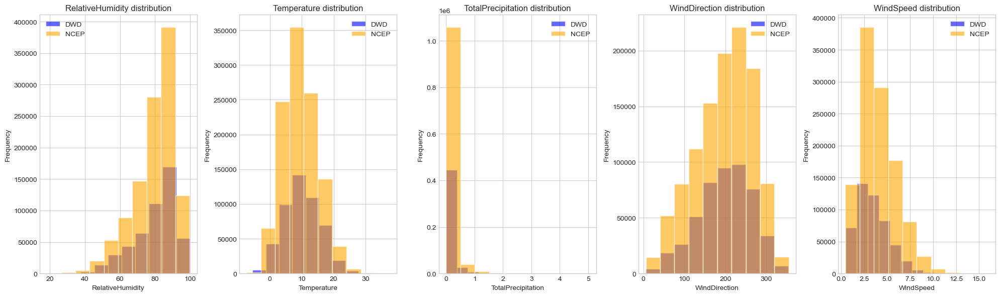

hornsea


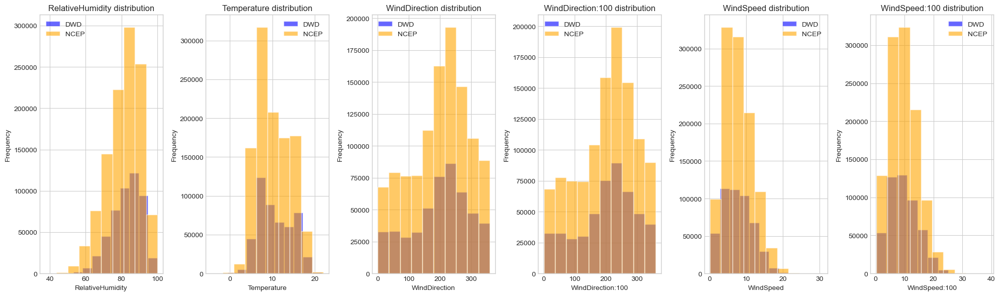

pes10


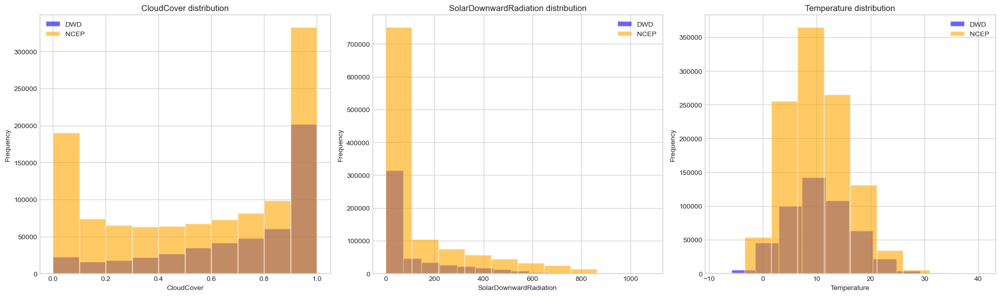

In [441]:
import importlib
importlib.reload(eda_utils)

dfs_demand = [df_icon_eu_demand_full_agg, df_gfs_demand_full_agg]
dfs_hornsea = [df_icon_eu_hornsea_full_agg, df_gfs_hornsea_full_agg]
dfs_pes10 = [df_icon_eu_pes10_full_agg, df_gfs_pes10_full_agg]
names = ["DWD", "NCEP"]
print("demand")
eda_utils.combine_histograms(dfs_demand, names)
print("hornsea")
eda_utils.combine_histograms(dfs_hornsea, names)
print("pes10")
eda_utils.combine_histograms(dfs_pes10, names)



### __Zeitliche Analyse der Features__

demand


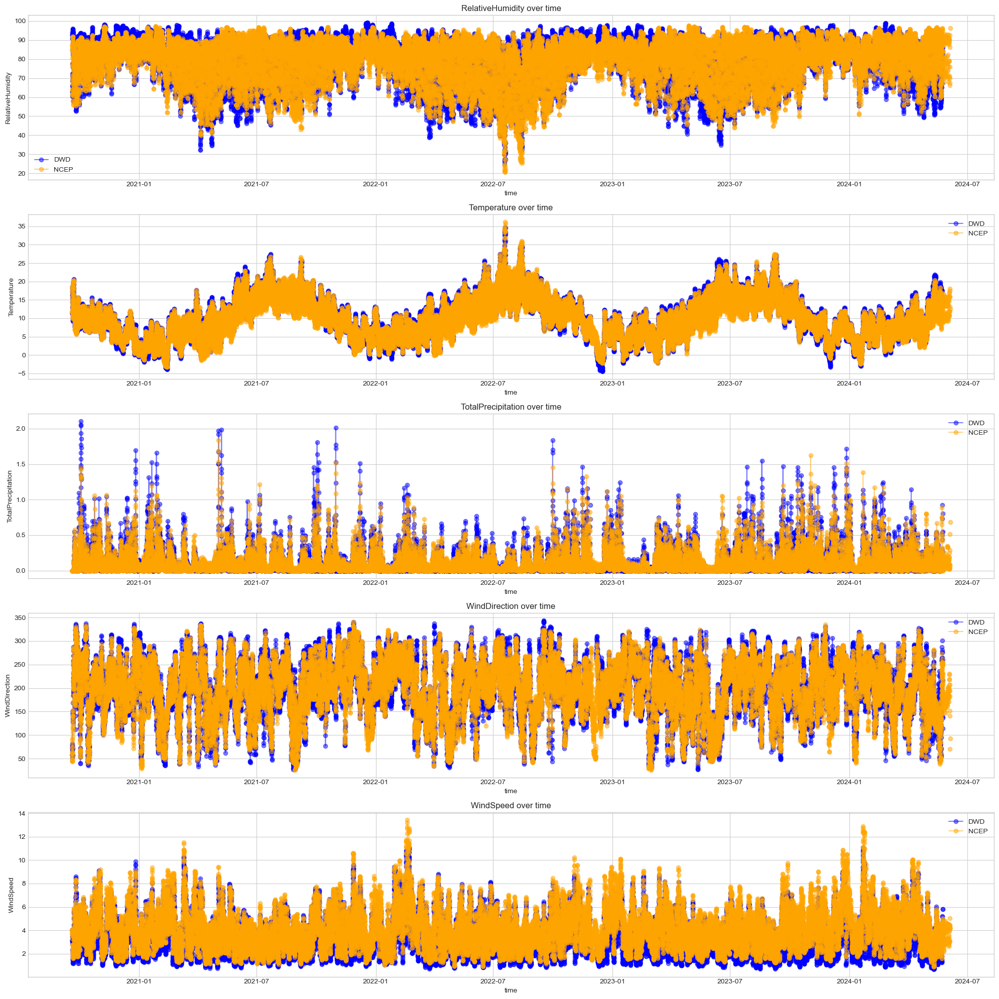

hornsea


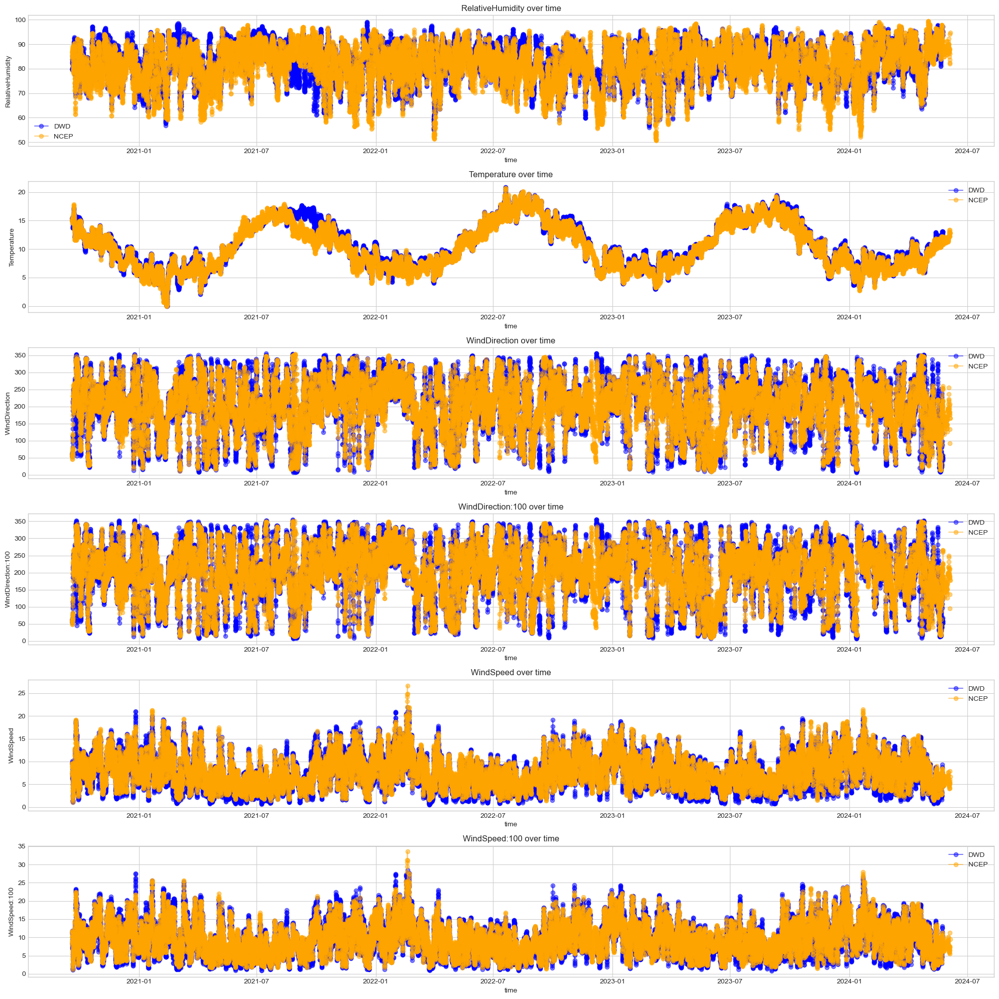

pes10


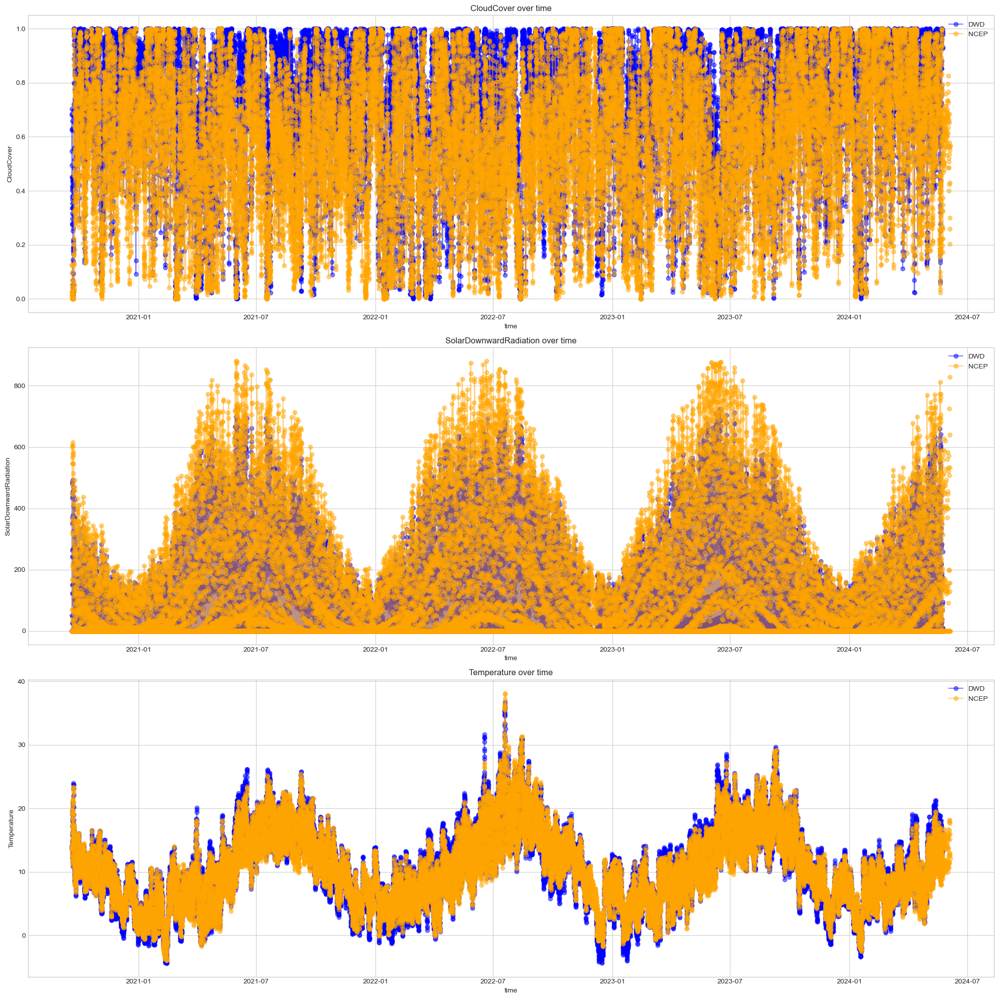

In [442]:
import importlib
importlib.reload(eda_utils)

names = ["DWD", "NCEP"]

print("demand")
eda_utils.compare_lineplots(dfs_demand, names, "H")

print("hornsea")
eda_utils.compare_lineplots(dfs_hornsea, names, "H")

print("pes10")
eda_utils.compare_lineplots(dfs_pes10, names, "H")



### __Analyse der Räumlichen Dimension__

In [351]:
importlib.reload(eda_utils)

filepaths = [
    "./data/dwd_icon_eu_demand_20200920_20231027.nc",
    "./data/dwd_icon_eu_demand_20231027_20240108.nc",
    "./data/dwd_icon_eu_demand_20240108_20240129.nc",
    "./data/dwd_icon_eu_demand_20240129_20240519.nc"
]

dwd_demand_geo = eda_utils.combine_files(filepaths, agg="coordinates")

file_paths = [
    "./data/ncep_gfs_demand_20200920_20231027.nc",
    "./data/ncep_gfs_demand_20231027_20240108.nc",
    "./data/ncep_gfs_demand_20240108_20240129.nc",
    "./data/ncep_gfs_demand_20240129_20240519.nc"
]

# Aufrufen der automatisierten Funktion
ncep_demand_geo = eda_utils.combine_files(file_paths, agg="coordinates")
ncep_demand_geo = ncep_demand_geo[ncep_demand_geo.longitude < 180]

filepaths = [
    "./data/dwd_icon_eu_hornsea_1_20200920_20231027.nc",
    "./data/dwd_icon_eu_hornsea_1_20231027_20240108.nc",
    "./data/dwd_icon_eu_hornsea_1_20240108_20240129.nc",
    "./data/dwd_icon_eu_hornsea_1_20240129_20240519.nc"
]

dwd_hornsea_geo = eda_utils.combine_files(filepaths, agg='coordinates')

file_paths = [
    "./data/ncep_gfs_hornsea_1_20200920_20231027.nc",
    "./data/ncep_gfs_hornsea_1_20231027_20240108.nc",
    "./data/ncep_gfs_hornsea_1_20240108_20240129.nc",
    "./data/ncep_gfs_hornsea_1_20240129_20240519.nc"
]

# Aufrufen der automatisierten Funktion
ncep_hornsea_geo = eda_utils.combine_files(file_paths, agg='coordinates')

filepaths = [
    "./data/dwd_icon_eu_pes10_20200920_20231027.nc",
    "./data/dwd_icon_eu_pes10_20231027_20240108.nc",
    "./data/dwd_icon_eu_pes10_20240108_20240129.nc",
    "./data/dwd_icon_eu_pes10_20240129_20240519.nc"
]

dwd_pes10_geo = eda_utils.combine_files(filepaths, agg='coordinates')

file_paths = [
    "./data/ncep_gfs_pes10_20200920_20231027.nc",
    "./data/ncep_gfs_pes10_20231027_20240108.nc",
    "./data/ncep_gfs_pes10_20240108_20240129.nc",
    "./data/ncep_gfs_pes10_20240129_20240519.nc"
]

# Aufrufen der automatisierten Funktion
ncep_pes10_geo = eda_utils.combine_files(file_paths, agg='coordinates')
ncep_pes10_geo = ncep_pes10_geo[ncep_pes10_geo.longitude < 180]

c:\Users\maxda\Studium\Semester7\Domaenenprojekt2\code\eda_utils.py:36: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.

c:\Users\maxda\Studium\Semester7\Domaenenprojekt2\code\eda_utils.py:36: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.

c:\Users\maxda\Studium\Semester7\Domaenenprojekt2\code\eda_utils.py:36: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.

c:\Users\maxda\Studium\Semester7\Domaenenprojekt2\code\eda_utils.py:36: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.

c:\Users\maxda\Studium\Semester7\Domaenenprojekt2\code\eda_utils.py:36: PerformanceWarning:

dropping on a non-lexsorted multi-index without a level parameter may impact performance.

c:\Users\maxda\Studium\Semester7\Domaenenprojekt2\code\eda_utils.py:36: Performa

dwd_demand


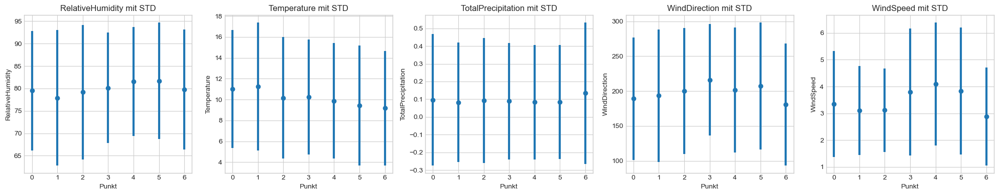

ncep_demand


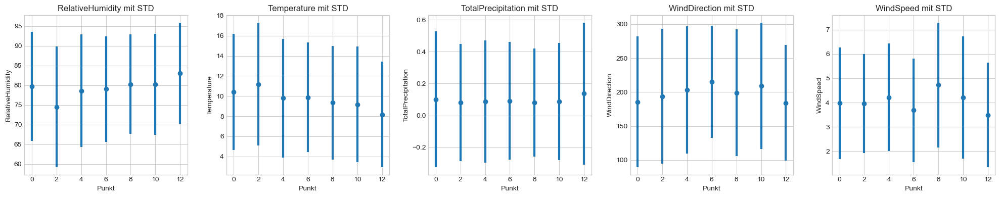

dwd_hornsea


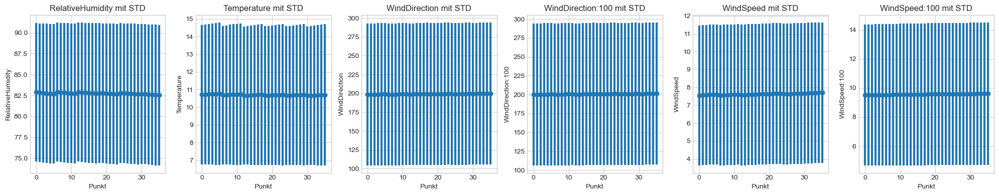

ncep_hornsea


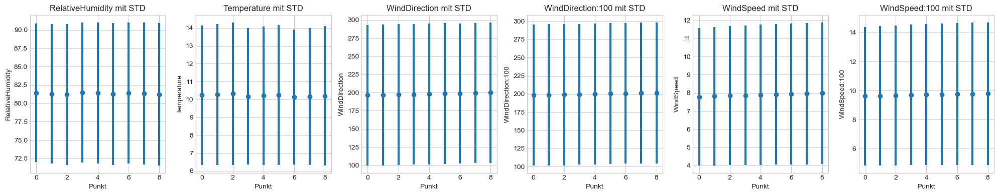

dwd_pes10


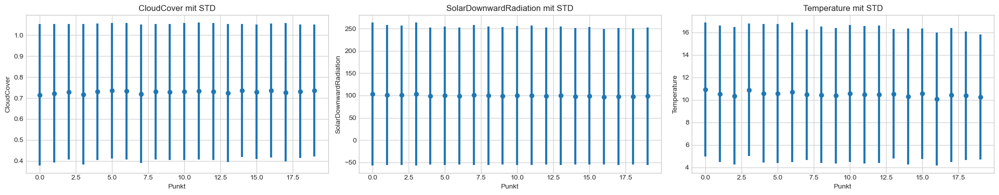

ncep_pes10


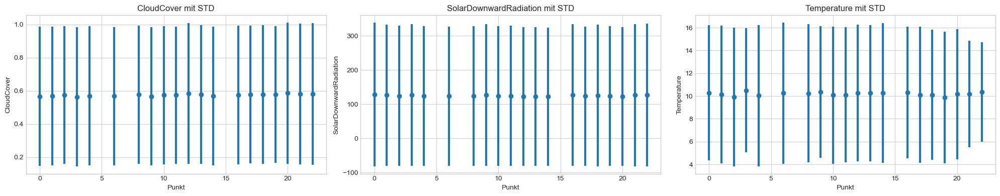

In [352]:
importlib.reload(eda_utils)

print("dwd_demand")
eda_utils.show_errorbar(dwd_demand_geo)
print("ncep_demand")
eda_utils.show_errorbar(ncep_demand_geo)
print('dwd_hornsea')
eda_utils.show_errorbar(dwd_hornsea_geo)
print("ncep_hornsea")
eda_utils.show_errorbar(ncep_hornsea_geo)
print("dwd_pes10")
eda_utils.show_errorbar(dwd_pes10_geo)
print("ncep_pes10")
eda_utils.show_errorbar(ncep_pes10_geo)

In [244]:
importlib.reload(eda_utils)

eda_utils.plot_stations_on_map([dwd_demand_geo, ncep_demand_geo, dwd_hornsea_geo, ncep_hornsea_geo, dwd_pes10_geo, ncep_pes10_geo], ['dwd_demand', 'ncep_demand', 'dwd_hornsea', 'ncep_hornsea', 'dwd_pes10', 'ncep_pes10_geo'])

### __Zusammenführen der Daten__

### __einlesen der Energie-Daten__

In [360]:
energy_data_1 = pd.read_csv("data/Energy_Data_20200920_20231027.csv")
energy_data_1["dtm"] = pd.to_datetime(energy_data_1["dtm"])
energy_data_2 = pd.read_csv("data/Energy_Data_20200920_20240118.csv")
energy_data_2["dtm"] = pd.to_datetime(energy_data_2["dtm"])
energy_data_3 = pd.read_csv("data/Energy_Data_20240119_20240519.csv")
energy_data_3["dtm"] = pd.to_datetime(energy_data_3["dtm"])



# energy_data["dtm"] = pd.to_datetime(energy_data["dtm"])
# energy_data["Wind_MWh_credit"] = 0.5*energy_data["Wind_MW"] - energy_data["boa_MWh"]
# energy_data["Solar_MWh_credit"] = 0.5*energy_data["Solar_MW"]
# energy_data

In [412]:
energy_data_2_test = energy_data_2[energy_data_2.dtm <= "2023-10-27 23:30:00+00:00" ]

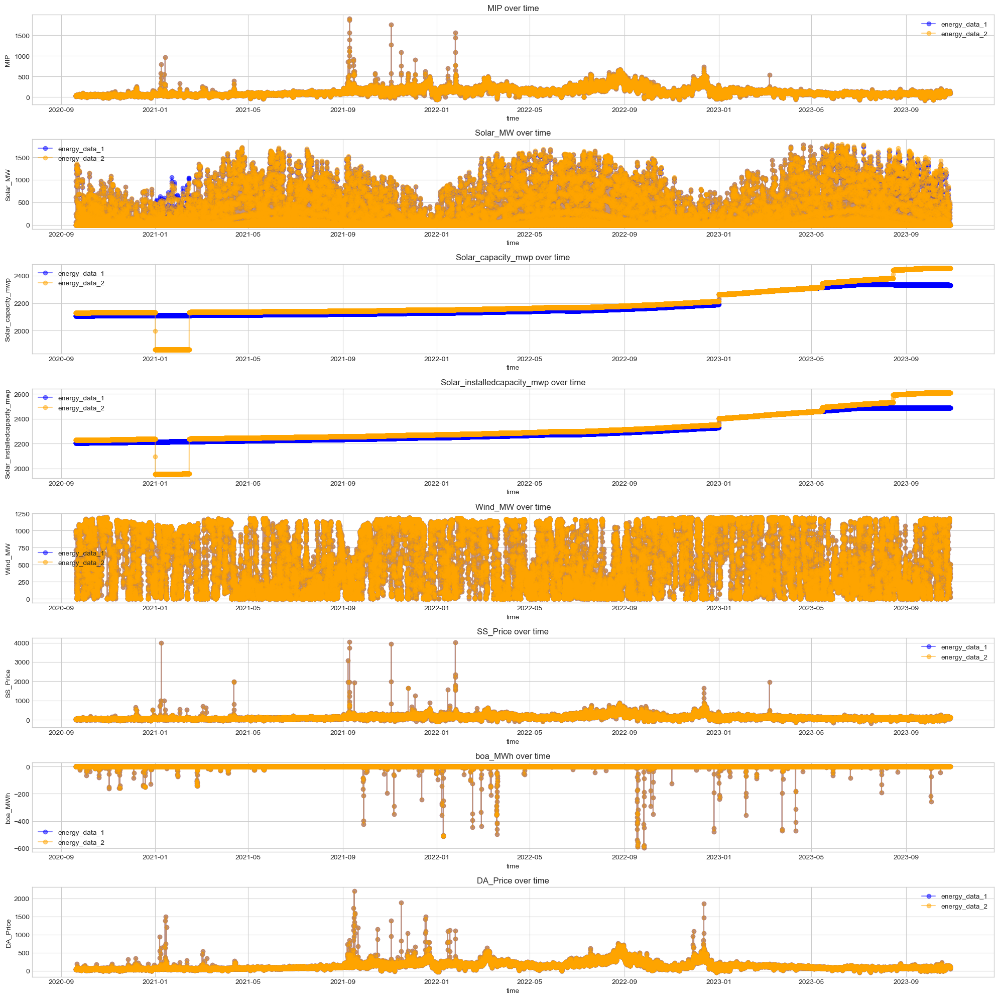

In [444]:
importlib.reload(eda_utils)
dfs = [energy_data_1, energy_data_2_test]
names = ["energy_data_1", "energy_data_2"]

eda_utils.compare_lineplots_energy(dfs, names, "H")

### __Energie Daten zusammenführen__

In [438]:
energy_data_full = pd.concat([energy_data_1, energy_data_2[energy_data_2.dtm >= energy_data_1.dtm.max()]], axis=0)
energy_data_full = pd.concat([energy_data_full, energy_data_3], axis=0)

energy_data_full["Wind_MWh_credit"] = 0.5*energy_data_full["Wind_MW"] - energy_data_full["boa_MWh"]
energy_data_full["Solar_MWh_credit"] = 0.5*energy_data_full["Solar_MW"]
energy_data_full

,dtm,MIP,Solar_MW,Solar_capacity_mwp,Solar_installedcapacity_mwp,Wind_MW,SS_Price,boa_MWh,DA_Price,Wind_MWh_credit,Solar_MWh_credit
0,2020-09-20 00:00:00+00:00,20.06,0.0,2108.489754,2206.064655,996.284,2.50000,0.0,32.17,498.142,0.0
1,2020-09-20 00:30:00+00:00,19.77,0.0,2108.489754,2206.064655,957.576,15.00000,0.0,32.17,478.788,0.0
2,2020-09-20 01:00:00+00:00,28.68,0.0,2108.489754,2206.064655,941.044,47.95000,0.0,32.00,470.522,0.0
3,2020-09-20 01:30:00+00:00,28.97,0.0,2108.489754,2206.064655,964.366,29.13000,0.0,32.00,482.183,0.0
4,2020-09-20 02:00:00+00:00,28.19,0.0,2108.489754,2206.064655,918.432,28.95000,0.0,31.99,459.216,0.0
...,...,...,...,...,...,...,...,...,...,...,...
5851,2024-05-19 21:30:00+00:00,77.40,0.0,2573.542092,2741.831037,227.518,56.20000,0.0,76.81,113.759,0.0
5852,2024-05-19 22:00:00+00:00,80.82,0.0,2573.542092,2741.831037,197.090,102.00023,0.0,71.11,98.545,0.0
5853,2024-05-19 22:30:00+00:00,75.69,0.0,2573.542092,2741.831037,171.306,99.00000,0.0,71.11,85.653,0.0
5854,2024-05-19 23:00:00+00:00,78.98,0.0,2573.542092,2741.831037,163.164,106.44988,0.0,66.51,81.582,0.0


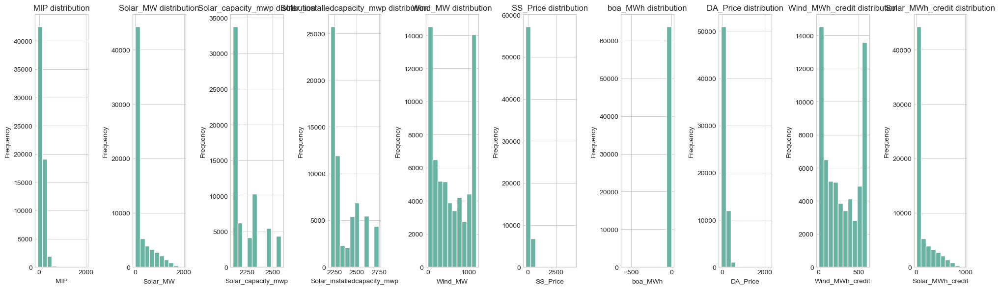

In [447]:
importlib.reload(eda_utils)

eda_utils.show_histograms(energy_data_full.iloc[:, 1:])

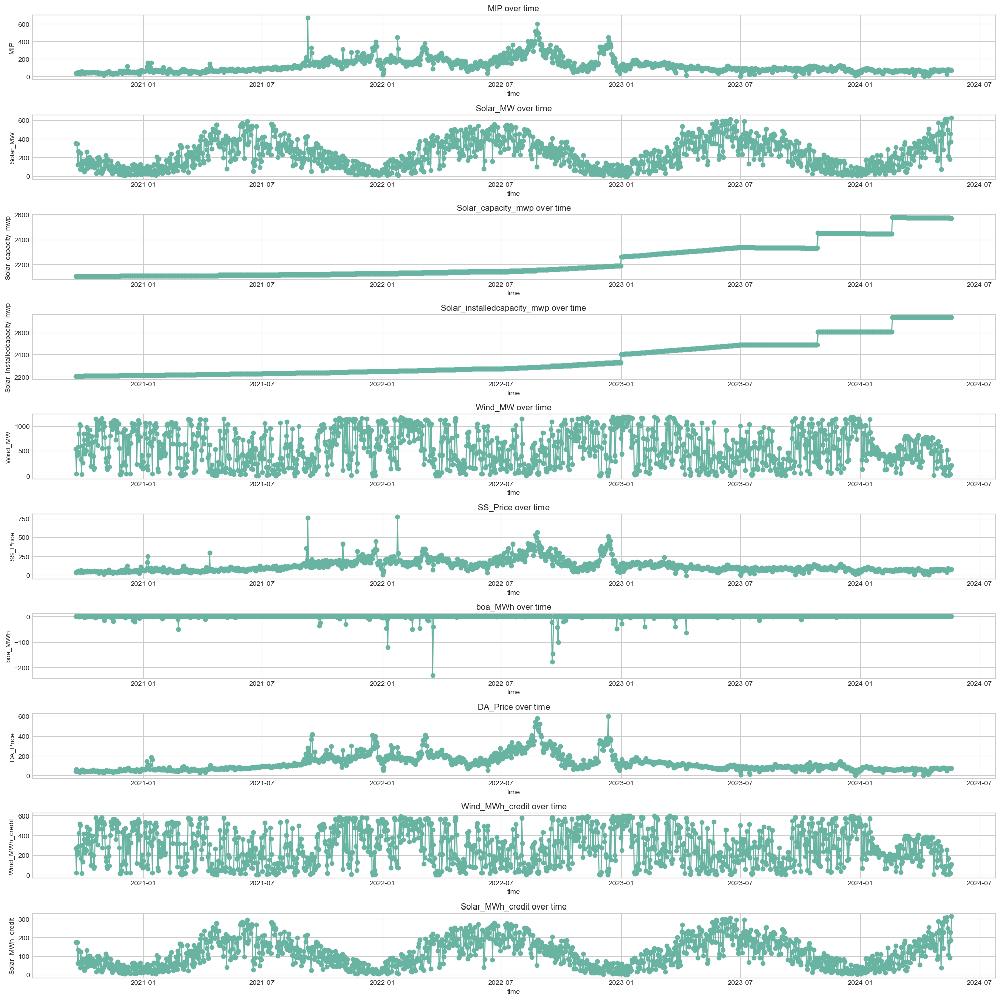

In [439]:
eda_utils.show_lineplot_energy(energy_data_full, freq="D")